# **License-Plate Detector - YOLOv5**
By Shreyam Gupta

******


# Data Handeling

In [ ]:
# dataset
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="8SQPIbEFpMhkhFBPVwje")
project = rf.workspace("shreyamgupta13asia-gmail-com").project("license-plate-detection-y5rw3")
dataset = project.version(1).download("yolov5")

In [ ]:
# Script to modify class_id of dataset

import os

def overwrite_dir(annot_dir):
  for annot_file in os.listdir(annot_dir):
    if annot_file.endswith(".txt"):
      with open(os.path.join(annot_dir, annot_file), 'r') as f:
        annot_lines = f.readlines()

      new_annot_lines = []
      for line in annot_lines:
        parts = line.split()
        parts[0] = "0"
        new_annot_lines.append(" ".join(parts) + "\n")


      with open(os.path.join(annot_dir, annot_file), 'w') as f:
        f.writelines(new_annot_lines)

annot_dir1 = "/content/license-plate-detection-1/train/labels"
overwrite_dir(annot_dir1)

annot_dir2 = "/content/license-plate-detection-1/test/labels"
overwrite_dir(annot_dir2)

annot_dir3 = "/content/license-plate-detection-1/valid/labels"
overwrite_dir(annot_dir3)



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import shutil

shutil.copytree('/content/license-plate-detection-1', '/content/drive/My Drive/Machine_Learning/datasets')

'/content/drive/My Drive/Machine Learning/datasets'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

"/content/drive/My Drive/Machine_Learning/datasets"

Mounted at /content/drive


'/content/drive/My Drive/Machine_Learning/datasets'

In [ ]:
# copying dataset from drive to collab for faster training times

#zipping dataset in drive
folder = "/content/drive/My Drive/Machine_Learning"

!(cd '{folder}' && zip -r -q datasets.zip datasets)

In [1]:


# starts from here
# Dataset sorted


# call below path whenever dataset required
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [2]:
!cp "/content/drive/MyDrive/Machine_Learning/datasets.zip" "/content/"

In [3]:
!unzip -q datasets.zip
!rm datasets.zip

# Installation

Choose PyTorch version that matchs your hardware from https://pytorch.org/ and install:

In [ ]:
!conda install pytorch torchvision cudatoolkit=11.3 -c pytorch

In [4]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt  # install

import torch
import utils
display = utils.notebook_init()  # checks

YOLOv5 🚀 v7.0-134-g23c4923 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 23.4/78.2 GB disk)


detect: weights=['yolov5s.pt'], source=data/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-134-g23c4923 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

100% 14.1M/14.1M [00:00<00:00, 350MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
image 1/2 /content/yolov5/data/images/bus.jpg: 640x480 4 persons, 1 bus, 39.4ms
image 2/2 /content/yolov5/data/images/zidane.jpg: 384x640 2 persons, 2 ties, 61.1ms
Speed: 0.6ms pre-process, 50.2ms inference, 103.0ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp


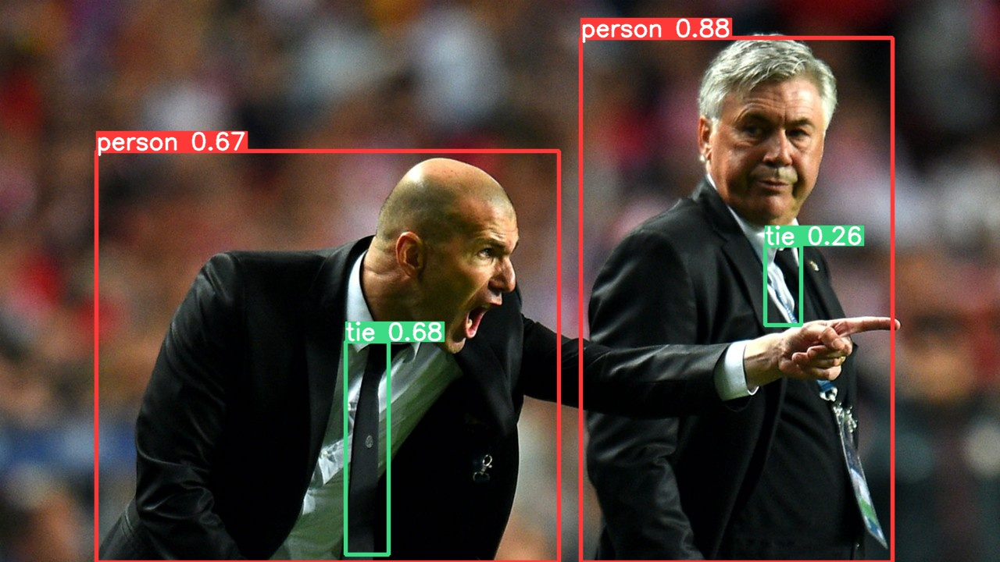

In [5]:

!python detect.py --weights yolov5s.pt --img 640 --conf 0.25 --source data/images
# --source 'https://static01.nyt.com/images/2020/12/18/nyregion/00-nyc-open-streets-still02/00-nyc-open-streets-still02-superJumbo.jpg'

display.Image(filename='runs/detect/exp/zidane.jpg', width=600)

In [ ]:
# yaml files

#  upload data config file "lic_plate_data_config.yaml" to yolov5/data
!cp "/content/drive/MyDrive/Machine_Learning/lic_plate_data_config.yaml" "/content/yolov5/data/"


# Script for model config file -> if need to train from scratch (not recommended)
# import os

# def overwrite_dir(annot_dir):
#   for annot_file in os.listdir(annot_dir):
#     if annot_file == 'yolov5s.yaml':
#       with open(os.path.join(annot_dir, annot_file), 'r') as f:
#         lines = f.readlines()

#       line_num = 4
#       lines[line_num-1] = 'nc: 1\n'

#       with open(os.path.join(annot_dir, annot_file), 'w') as f:
#         f.writelines(lines)

# annot_dir1 = "/content/yolov5/models"
# overwrite_dir(annot_dir1)



# Training

## Feature extraction

In [ ]:
# freeze - to compensate for small dataset model backbone layers (feature extractor) unchanged only training head layers (outcome)
!python train.py --img 640 --batch -1 --epochs 150 --data lic_plate_data_config.yaml --cfg ./models/yolov5s.yaml --weights yolov5s.pt --cache --freeze 10

2023-04-04 16:57:06.325436: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-04 16:57:07.837213: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
train: weights=yolov5s.pt, cfg=./models/yolov5s.yaml, data=lic_plate_data_config.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=-1, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[10], save_period=-1, seed=0, local_rank=-1, entity=None, up

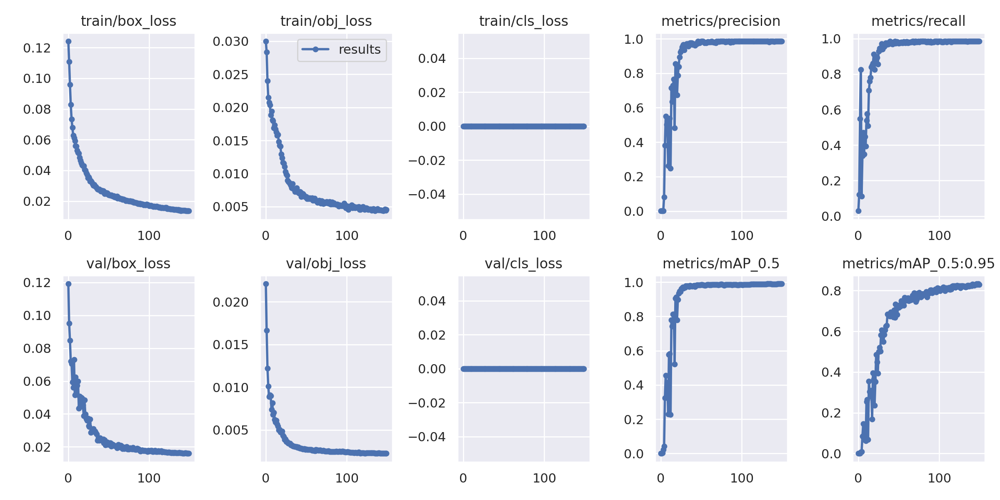

In [24]:
display.Image(f"runs/train/exp/results.png")

## Fine Tuning

In [ ]:
!python train.py --img 640 --batch -1 --epochs 100 --hyp 'hyp.VOC.yaml' --data lic_plate_data_config.yaml --weights /content/yolov5/runs/train/exp/weights/best.pt --name "fine_tuning" --cache ram

[Errno 2] No such file or directory: 'yolov5'
/content/yolov5
2023-04-04 17:38:54.143447: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-04 17:38:55.143098: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
train: weights=/content/yolov5/runs/train/exp/weights/best.pt, cfg=, data=lic_plate_data_config.yaml, hyp=hyp.VOC.yaml, epochs=100, batch_size=-1, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=fine_tuning, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, 

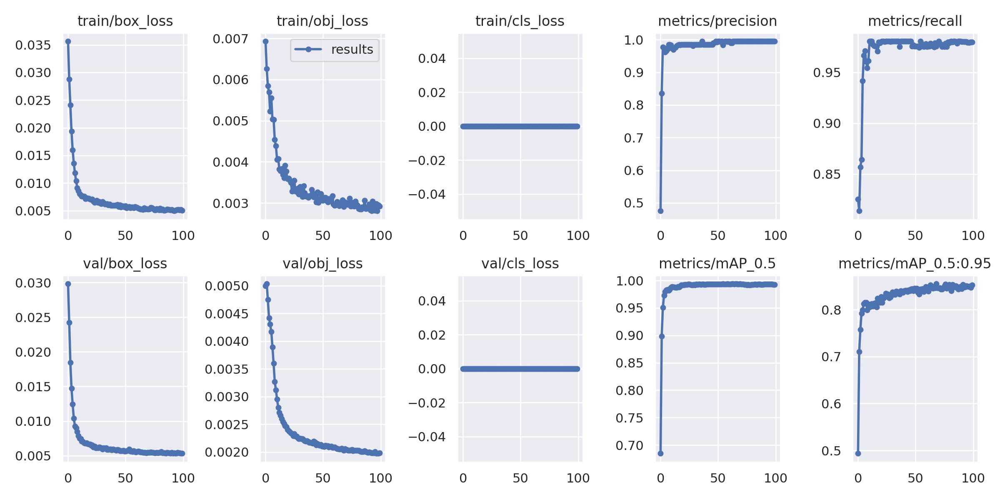

In [25]:
display.Image(f"runs/train/fine_tuning/results.png")

detect: weights=['/content/yolov5/runs/train/fine_tuning/weights/best.pt'], source=data/images/demo.jpeg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-134-g23c4923 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/yolov5/data/images/demo.jpeg: 384x640 3 license_plates, 87.2ms
Speed: 0.5ms pre-process, 87.2ms inference, 136.0ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp4


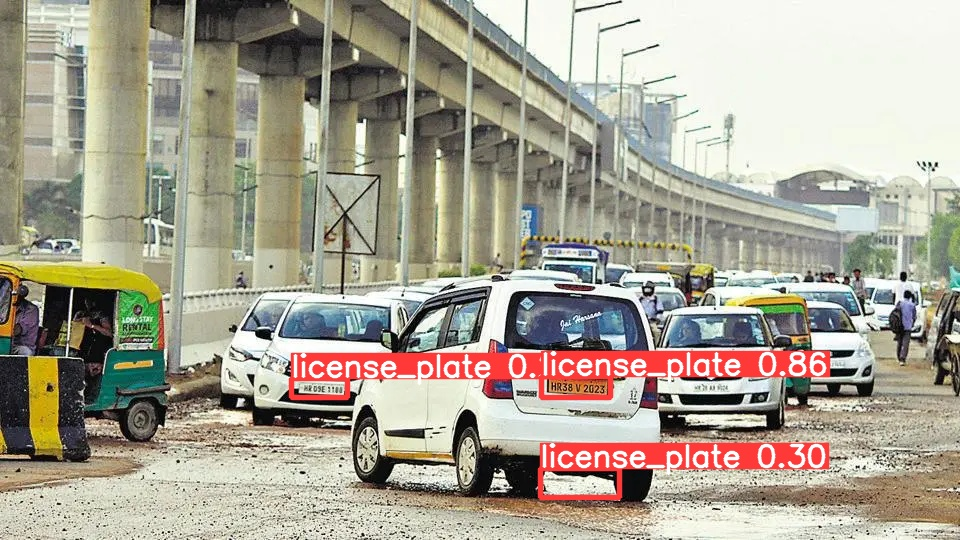

In [ ]:
!python detect.py --weights /content/yolov5/runs/train/fine_tuning/weights/best.pt --img 640 --source data/images/demo.jpeg
display.Image(filename='runs/detect/exp4/demo.jpeg', width=600)

In [ ]:
# Start tensorboard
# Launch after you have started training to all the graphs needed for inspection
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir /content/yolov5/runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

# Validation

In [ ]:
!python val.py --weights /content/yolov5/runs/train/exp/weights/best.pt --data lic_plate_data_config.yaml --img 640 --task test --name 'Validation_exp' --augment

val: data=/content/yolov5/data/lic_plate_data_config.yaml, weights=['/content/yolov5/runs/train/exp/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=True, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=Validation_exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-134-g23c4923 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
test: Scanning /content/datasets/test/labels.cache... 107 images, 0 backgrounds, 0 corrupt: 100% 107/107 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 4/4 [00:06<00:00,  1.72s/it]
                   all        107        107      0.996      0.991      0.995      0.841
Speed: 2.7ms pre-process, 21.1ms inference, 4.7ms NMS per image at sha

In [ ]:
!python val.py --weights /content/yolov5/runs/train/fine_tuning/weights/best.pt --data lic_plate_data_config.yaml --img 640 --task test --name 'Validation' --augment

val: data=/content/yolov5/data/lic_plate_data_config.yaml, weights=['/content/yolov5/runs/train/fine_tuning/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=True, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=Validation, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-134-g23c4923 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
test: Scanning /content/datasets/test/labels... 107 images, 0 backgrounds, 0 corrupt: 100% 107/107 [00:00<00:00, 520.30it/s]
test: New cache created: /content/datasets/test/labels.cache
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 4/4 [00:09<00:00,  2.47s/it]
                   all        107        107      0.997      0.991      0.995      0.846
Spee

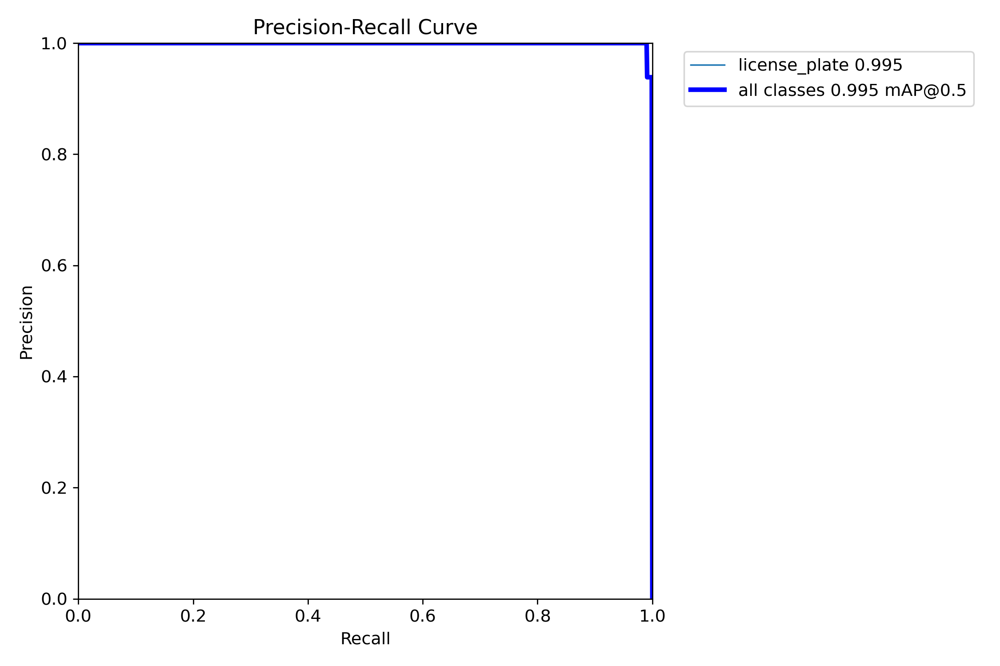

In [30]:
display.Image(f"runs/val/Validation2/PR_curve.png", width = 600)

# Inference

In [ ]:
!python detect.py --weights /content/yolov5/runs/train/fine_tuning/weights/best.pt --img 640 --conf 0.4 --augment --source ../datasets/test/images

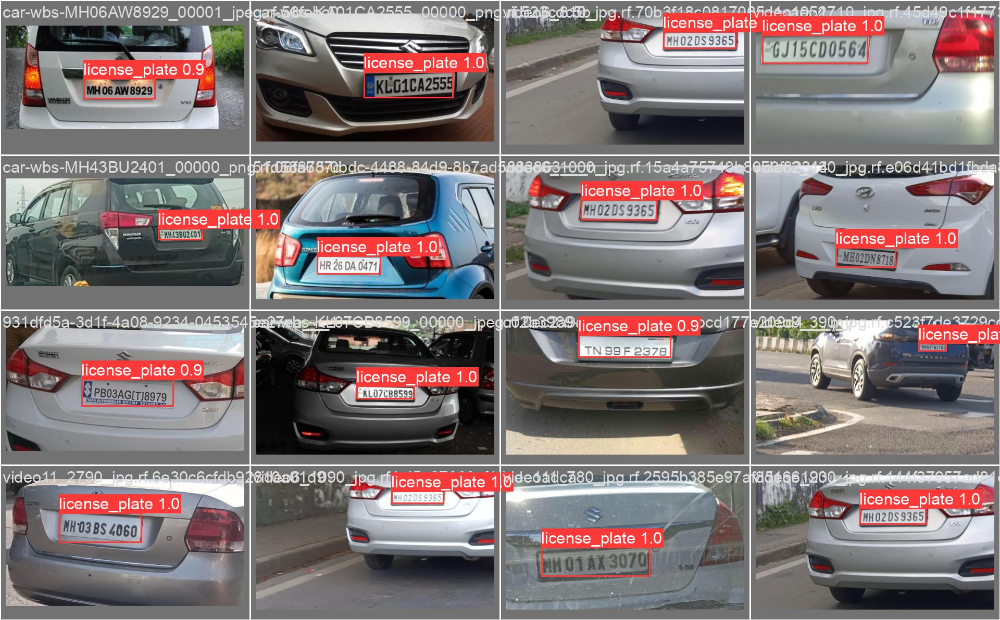

In [45]:
display.Image(f'runs/val/Validation2/val_batch0_pred.jpg', width = 1000)

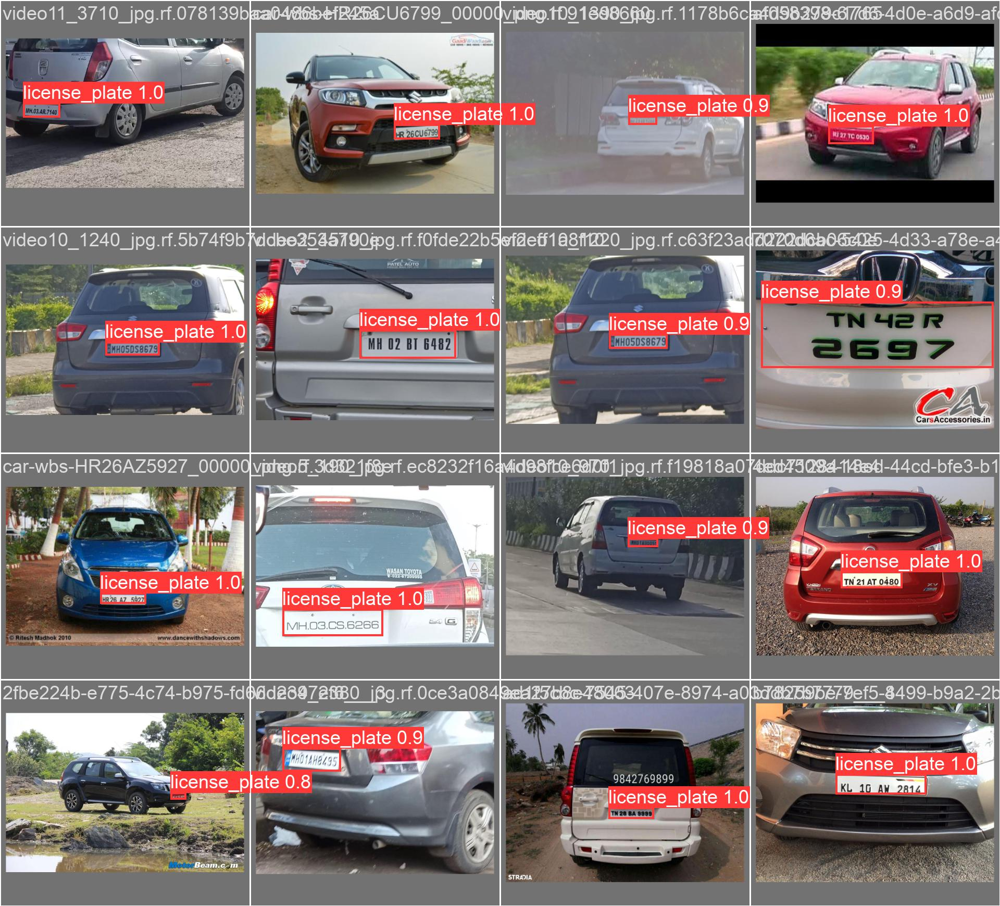

In [46]:
display.Image(f'runs/val/Validation2/val_batch1_pred.jpg', width = 1000)

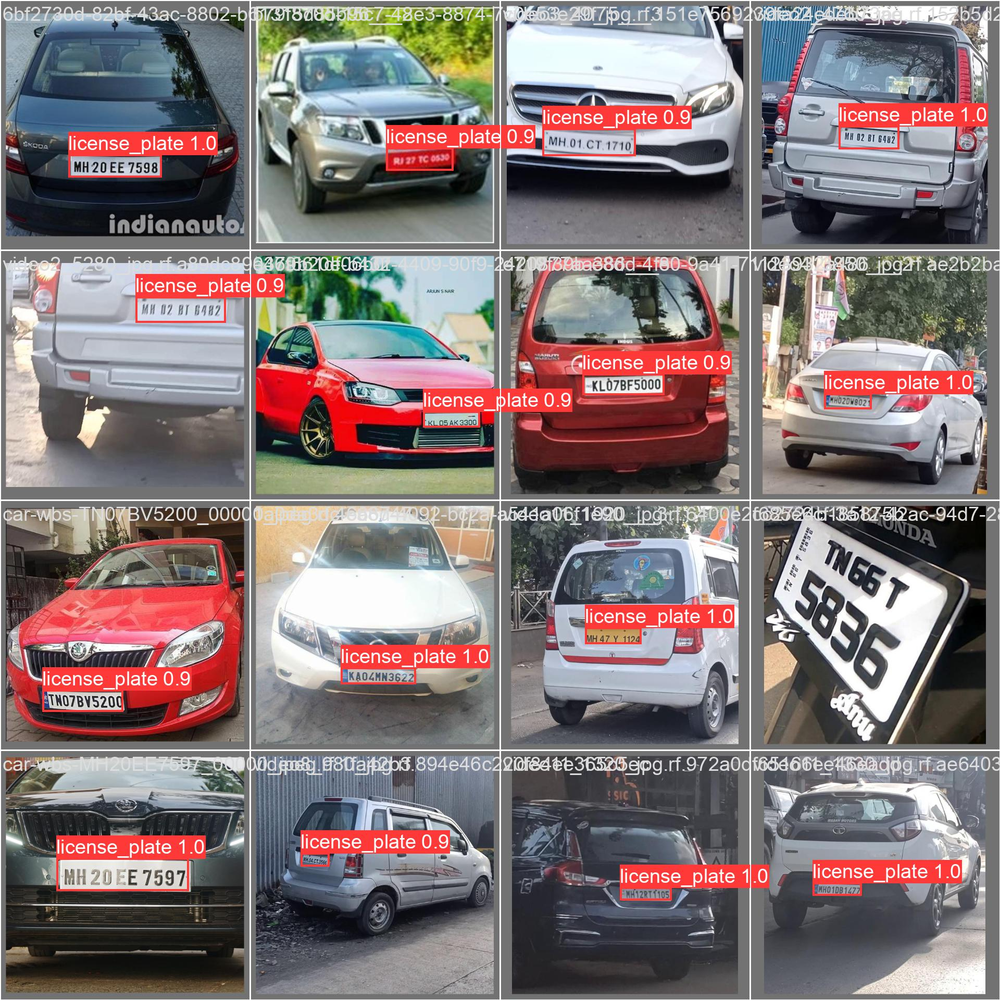

In [48]:
display.Image(f'runs/val/Validation2/val_batch2_pred.jpg', width = 1000)

detect: weights=['/content/yolov5/runs/train/fine_tuning/weights/best.pt'], source=data/images/asd2.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-134-g23c4923 Python-3.9.16 torch-2.0.0+cu118 CPU

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/yolov5/data/images/asd2.jpg: 544x640 3 license_plates, 357.8ms
Speed: 2.4ms pre-process, 357.8ms inference, 1.6ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp3


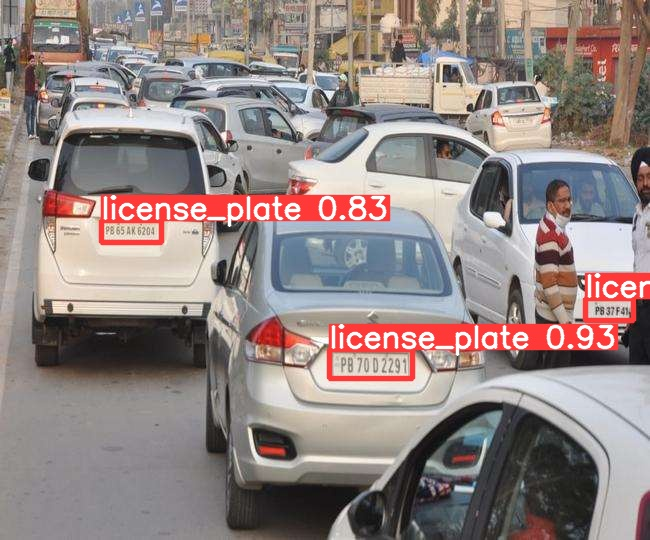

In [ ]:
!python detect.py --weights /content/yolov5/runs/train/fine_tuning/weights/best.pt --img 640 --source data/images/asd2.jpg
display.Image(filename='runs/detect/exp3/asd2.jpg', width=600)

detect: weights=['/content/yolov5/runs/train/fine_tuning/weights/best.pt'], source=data/images/asd7.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-134-g23c4923 Python-3.9.16 torch-2.0.0+cu118 CPU

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/yolov5/data/images/asd7.jpg: 448x640 3 license_plates, 292.0ms
Speed: 2.5ms pre-process, 292.0ms inference, 1.3ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp8


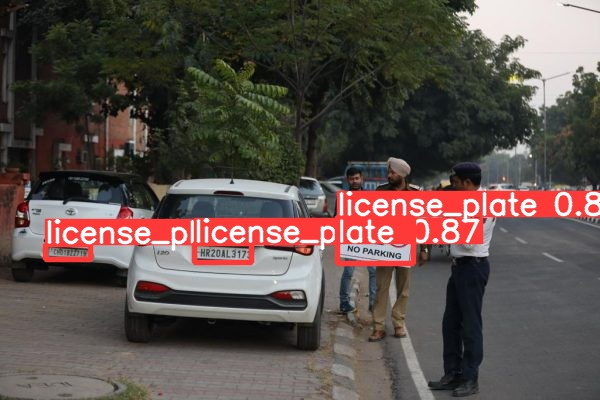

In [ ]:
!python detect.py --weights /content/yolov5/runs/train/fine_tuning/weights/best.pt --img 640 --source data/images/asd7.jpg
display.Image(filename='runs/detect/exp8/asd7.jpg', width=600)